In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [8]:
# Step 1: Imports
import os
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np


In [9]:
class YOLOResNet(nn.Module):
    def __init__(self, num_classes=20, S=7, B=2):
        super(YOLOResNet, self).__init__()
        self.S = S
        self.B = B
        self.C = num_classes

        resnet = models.resnet34(pretrained=False)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2],
                                      nn.AdaptiveAvgPool2d((S, S)))

        self.head = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(1024, self.C + self.B * 5, kernel_size=1)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = self.head(x)
        return x.permute(0, 2, 3, 1)  # [B, S, S, 30]


In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = YOLOResNet(S=7)
model.load_state_dict(torch.load("/kaggle/input/resnetyoloobject/pytorch/default/1/best_model_new.pth", map_location=device))
model.to(device)
model.eval()


YOLOResNet(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

In [11]:
VOC_CLASSES = [
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

def infer_image(model, image_path, device, conf_threshold=0.3):
    image = Image.open(image_path).convert("RGB")
    orig_w, orig_h = image.size

    transform = transforms.Compose([
        transforms.Resize((448, 448)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406),
                             std=(0.229, 0.224, 0.225))
    ])
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predictions = model(input_tensor)[0].cpu().numpy()  # [7, 7, 30]

    boxes = []
    for i in range(7):
        for j in range(7):
            cell = predictions[i, j]
            class_probs = cell[10:]
            class_id = np.argmax(class_probs)
            class_score = class_probs[class_id]

            for b in range(2):
                x, y, w, h, conf = cell[b*5:b*5+5]
                total_conf = conf * class_score

                if total_conf > conf_threshold:
                    cx = (j + x) / 7 * 448
                    cy = (i + y) / 7 * 448
                    w *= 448
                    h *= 448

                    x1 = int(cx - w / 2)
                    y1 = int(cy - h / 2)
                    x2 = int(cx + w / 2)
                    y2 = int(cy + h / 2)

                    # Clip and sort coordinates
                    x1, x2 = sorted([max(0, x1), min(orig_w - 1, x2)])
                    y1, y2 = sorted([max(0, y1), min(orig_h - 1, y2)])

                    boxes.append((x1, y1, x2, y2, VOC_CLASSES[class_id], total_conf))

    draw = ImageDraw.Draw(image)
    for x1, y1, x2, y2, label, score in boxes:
        draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
        draw.text((x1, y1 - 10), f"{label} {score:.2f}", fill="red")

    return image


🖼️ Found 4952 images to infer.


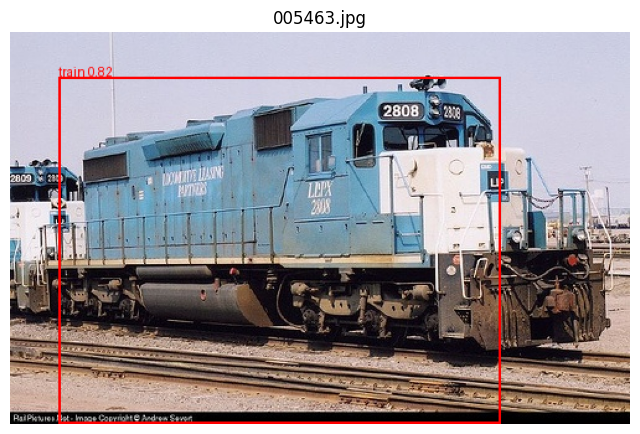

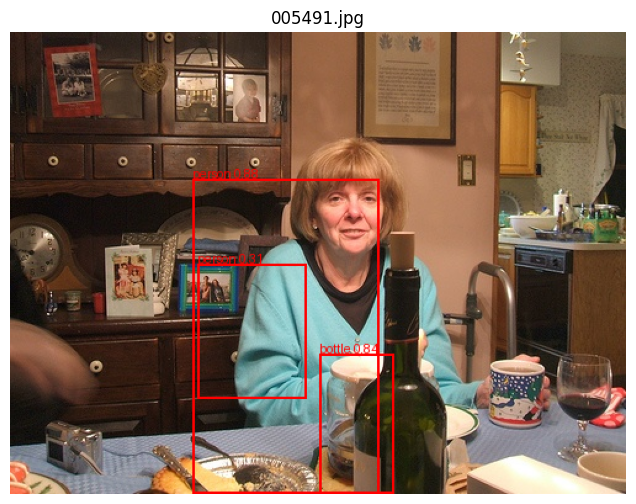

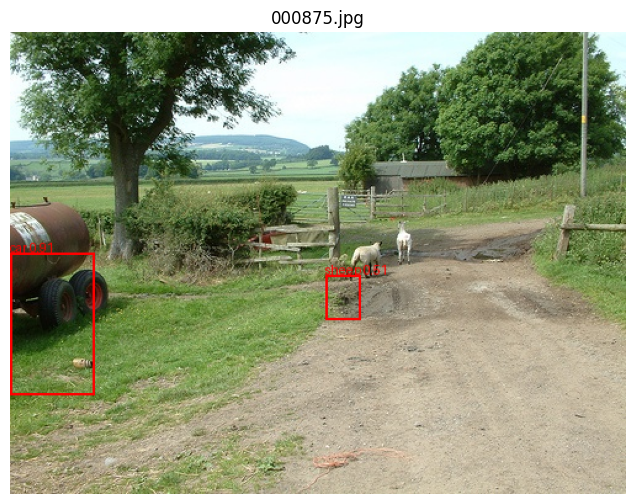

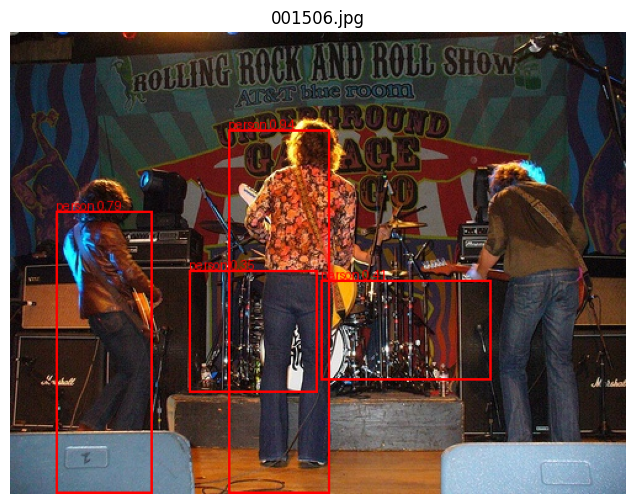

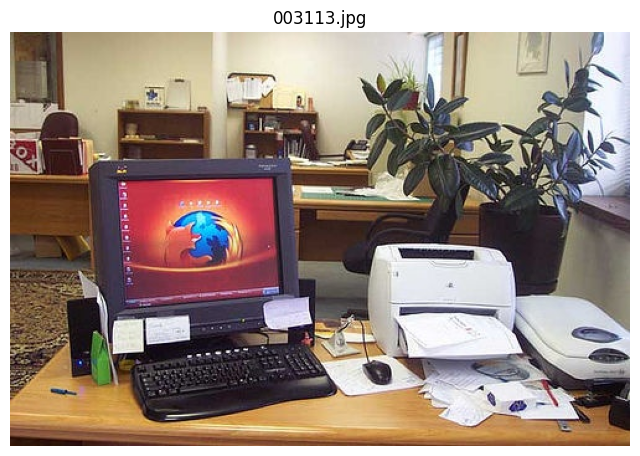

...

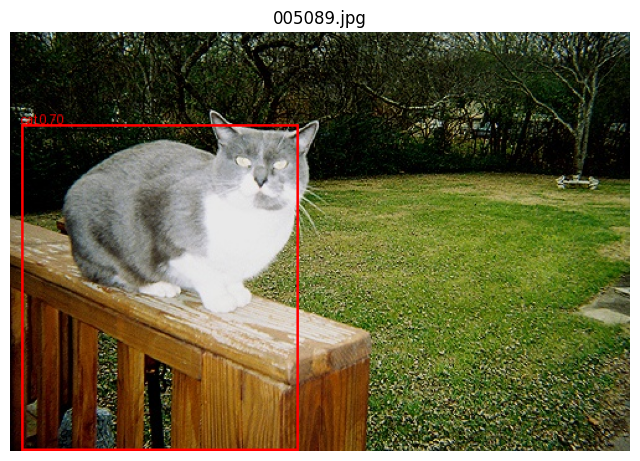

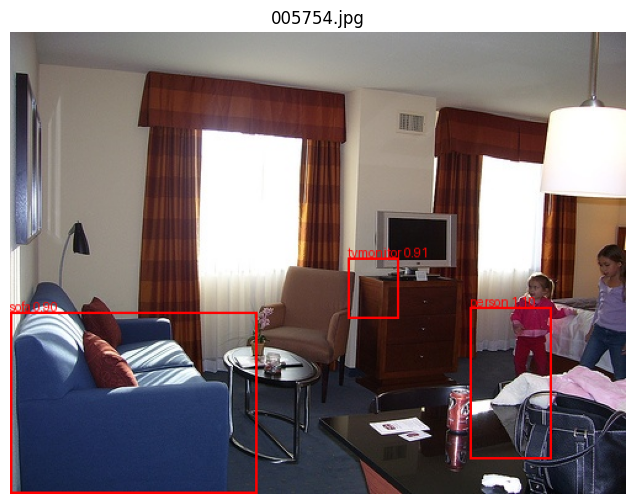

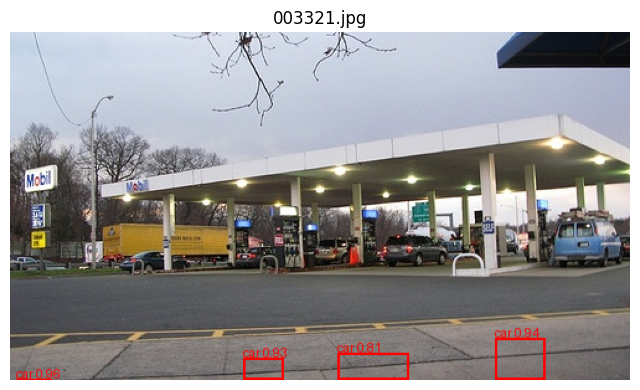

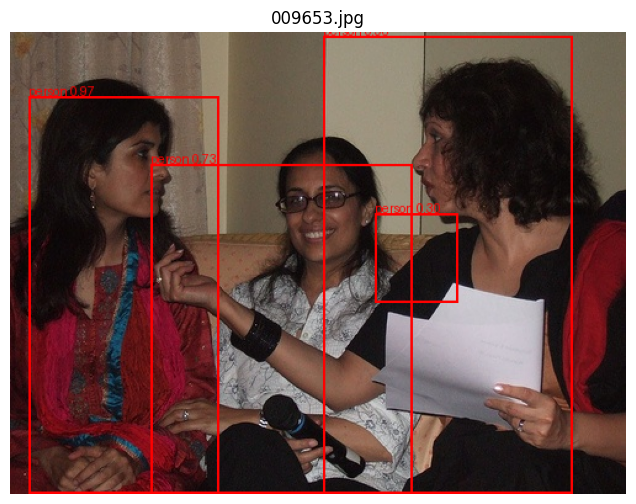

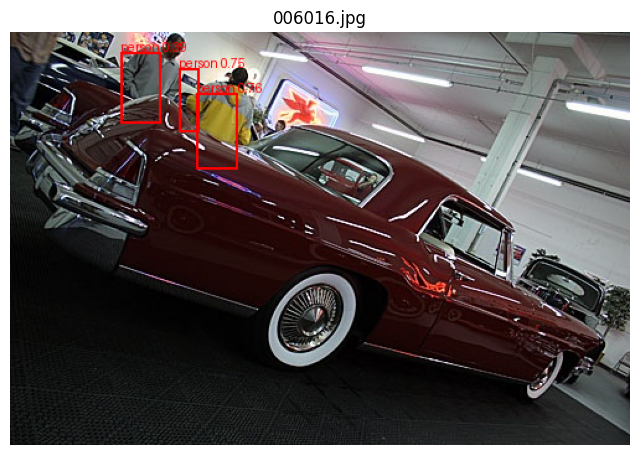

In [12]:
image_dir = "/kaggle/input/pascal-voc-2007/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages"  # replace with your actual folder
image_paths = [
    os.path.join(image_dir, fname)
    for fname in os.listdir(image_dir)
    if fname.lower().endswith((".jpg", ".jpeg", ".png"))
]

print(f"🖼️ Found {len(image_paths)} images to infer.")
test_samples=0
for path in image_paths:
    output = infer_image(model, path, device, conf_threshold=0.3)
    test_samples+=1
    # Display result
    plt.figure(figsize=(8, 6))
    plt.imshow(output)
    plt.title(os.path.basename(path))
    plt.axis("off")
    plt.show()
    if test_samples==25:
        break